# End-to-End Twitter Turkish Sentiment Analysis Application
## 3-Word Cloud



### Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.chdir('/content/drive/MyDrive/morethan101/')

### Install Packages

In [3]:
!pip install nltk
!pip install emot==3.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.5/61.5 KB 2.6 MB/s eta 0:00:00


### Import Packages

In [4]:
import nltk
nltk.download(['punkt', 'stopwords'])

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [5]:
import pandas as pd
from wordcloud import WordCloud, ImageColorGenerator
import matplotlib.pyplot as plt

### Load Data

In [6]:
STOPWORDS_FILEPATH = "data/stopwords_tr.txt"
SAVE_WORD_CLOUD_FILEPATH = "data/deprem_hashtag_subat_2023_{0}_wordcloud_freq.png"

In [7]:
df = pd.read_csv('data/deprem_hashtag_subat_2023_unique.csv')
df

,Unnamed: 0,ID,Date,Username,Tweet,ReplyCount,RetweetCount,LikeCount,QuoteCount,URL
0,0,1622746962318577664,2023-02-06 23:59:59+00:00,Brk34587273,İstanbulda gök gürültüsü başladı Allah’ım sen ...,0,1,1,0,https://twitter.com/Brk34587273/status/1622746...
1,1,1622746958363328512,2023-02-06 23:59:58+00:00,SerbestSabuncu,#deprem \nBu gece dualarımız enkaz altında kal...,0,1,1,0,https://twitter.com/SerbestSabuncu/status/1622...
2,2,1622746957792915457,2023-02-06 23:59:58+00:00,zeynepkacar2504,Ülkede afet var fırsatçılar iş başında..!\nÜlk...,0,1,2,0,https://twitter.com/zeynepkacar2504/status/162...
3,3,1622746957172117505,2023-02-06 23:59:58+00:00,Ahmetusmann,ARKADAŞIMIZDAN HABER ALAMIYORUZ ACİLEN RT ATIP...,11,1102,571,9,https://twitter.com/Ahmetusmann/status/1622746...
4,4,1622746954118619137,2023-02-06 23:59:57+00:00,aligsderya,Askerlerimiz kışladan çıksın Yollar KAPALI z...,0,0,7,0,https://twitter.com/aligsderya/status/16227469...
...,...,...,...,...,...,...,...,...,...,...
19802,19995,1622721663790985217,2023-02-06 22:19:28+00:00,AruobaB,İnanamıyorum insanlarımız ölüyo hem de saçma s...,0,0,0,0,https://twitter.com/AruobaB/status/16227216637...
19803,19996,1622721663631589376,2023-02-06 22:19:27+00:00,halit_tazeoglu,Dışarıda soğukta kalan varsa Gaziantep Ortadoğ...,1,0,1,0,https://twitter.com/halit_tazeoglu/status/1622...
19804,19997,1622721662624956416,2023-02-06 22:19:27+00:00,anildegilim,@grahamlicc ‼️ arkadasimin halasindan 20 saatt...,0,0,0,0,https://twitter.com/anildegilim/status/1622721...
19805,19998,1622721662306189317,2023-02-06 22:19:27+00:00,BayogluIsrafil,"Biz ne ara bu kadar kötü, çıkarcı, vefasız ve ...",1,0,6,0,https://twitter.com/BayogluIsrafil/status/1622...


In [8]:
df_positive = pd.read_csv('data/deprem_hashtag_subat_2023_positive.csv')
df_positive

,Unnamed: 0,Unnamed: 0.1,ID,Date,Username,Tweet,ReplyCount,RetweetCount,LikeCount,QuoteCount,URL,sentiment_label,sentiment_score
0,1,1,1622746958363328512,2023-02-06 23:59:58+00:00,SerbestSabuncu,#deprem \nBu gece dualarımız enkaz altında kal...,0,1,1,0,https://twitter.com/SerbestSabuncu/status/1622...,positive,0.8156
1,4,4,1622746954118619137,2023-02-06 23:59:57+00:00,aligsderya,Askerlerimiz kışladan çıksın Yollar KAPALI z...,0,0,7,0,https://twitter.com/aligsderya/status/16227469...,positive,0.8603
2,5,5,1622746952893976578,2023-02-06 23:59:57+00:00,hamzacak,"Gün suçlu arama; sağa veya sola çamur atma, ik...",0,0,0,0,https://twitter.com/hamzacak/status/1622746952...,positive,0.9234
3,6,6,1622746949722963969,2023-02-06 23:59:56+00:00,Haruun_,"Keşke, Keşkee, Keşkeee 🙏🙄\n#deprem #TSKsahaya ...",0,0,0,0,https://twitter.com/Haruun_/status/16227469497...,positive,0.9021
4,7,7,1622746948225716225,2023-02-06 23:59:56+00:00,asivesahsi,SİTE 1 NO:20 HATAY MERKEZ MELİSA YARDIM BEKLİY...,0,0,0,0,https://twitter.com/asivesahsi/status/16227469...,positive,0.6985
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7544,19791,19984,1622721673764929537,2023-02-06 22:19:30+00:00,FatmaKahriman18,"Haber alamıyoruz lütfen yayalım, ulaştıralım...",0,6,2,0,https://twitter.com/FatmaKahriman18/status/162...,positive,0.8268
7545,19793,19986,1622721672699674626,2023-02-06 22:19:30+00:00,LiderHaberAjans,Kars’tan deprem bölgesine 16 iş makinesi gönde...,5,27,352,2,https://twitter.com/LiderHaberAjans/status/162...,positive,0.8970
7546,19794,19987,1622721670594142208,2023-02-06 22:19:29+00:00,iy26022010,Şakamı abi #deprem #hataydepremi #antakya #AFA...,0,0,0,0,https://twitter.com/iy26022010/status/16227216...,positive,0.5310
7547,19800,19993,1622721666102005760,2023-02-06 22:19:28+00:00,kaaa_kkkk,Malatya'da çalışmalar devam ediyor #deprem htt...,0,0,0,0,https://twitter.com/kaaa_kkkk/status/162272166...,positive,0.7261


In [9]:
df_negative = pd.read_csv('data/deprem_hashtag_subat_2023_negative.csv')
df_negative

,Unnamed: 0,Unnamed: 0.1,ID,Date,Username,Tweet,ReplyCount,RetweetCount,LikeCount,QuoteCount,URL,sentiment_label,sentiment_score
0,0,0,1622746962318577664,2023-02-06 23:59:59+00:00,Brk34587273,İstanbulda gök gürültüsü başladı Allah’ım sen ...,0,1,1,0,https://twitter.com/Brk34587273/status/1622746...,negative,0.9343
1,2,2,1622746957792915457,2023-02-06 23:59:58+00:00,zeynepkacar2504,Ülkede afet var fırsatçılar iş başında..!\nÜlk...,0,1,2,0,https://twitter.com/zeynepkacar2504/status/162...,negative,0.9911
2,3,3,1622746957172117505,2023-02-06 23:59:58+00:00,Ahmetusmann,ARKADAŞIMIZDAN HABER ALAMIYORUZ ACİLEN RT ATIP...,11,1102,571,9,https://twitter.com/Ahmetusmann/status/1622746...,negative,0.9968
3,9,9,1622746946325577728,2023-02-06 23:59:55+00:00,KbraKoy98945001,Adıyaman yardım bekliyor nolur enkaz altınlard...,0,0,2,0,https://twitter.com/KbraKoy98945001/status/162...,negative,0.9456
4,10,10,1622746945784512514,2023-02-06 23:59:55+00:00,Denzi28,#hatayyardimbekliyor #deprem #foxtv @ahbap @De...,1,2,4,0,https://twitter.com/Denzi28/status/16227469457...,negative,0.9982
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12253,19802,19995,1622721663790985217,2023-02-06 22:19:28+00:00,AruobaB,İnanamıyorum insanlarımız ölüyo hem de saçma s...,0,0,0,0,https://twitter.com/AruobaB/status/16227216637...,negative,0.9907
12254,19803,19996,1622721663631589376,2023-02-06 22:19:27+00:00,halit_tazeoglu,Dışarıda soğukta kalan varsa Gaziantep Ortadoğ...,1,0,1,0,https://twitter.com/halit_tazeoglu/status/1622...,negative,0.5360
12255,19804,19997,1622721662624956416,2023-02-06 22:19:27+00:00,anildegilim,@grahamlicc ‼️ arkadasimin halasindan 20 saatt...,0,0,0,0,https://twitter.com/anildegilim/status/1622721...,negative,0.8692
12256,19805,19998,1622721662306189317,2023-02-06 22:19:27+00:00,BayogluIsrafil,"Biz ne ara bu kadar kötü, çıkarcı, vefasız ve ...",1,0,6,0,https://twitter.com/BayogluIsrafil/status/1622...,negative,0.9989


### Preprocess 

In [13]:
import re
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist

In [19]:
def get_stopwords_list():
    s_words = []
    w_file = open(STOPWORDS_FILEPATH, encoding="utf-8")
    
    for word in w_file:
        s_words.append(word.strip()) 


    #stop_words.append("Yerli")

    w_file.close()

    return s_words

In [20]:
stop_words = get_stopwords_list()
len(stop_words)

620

In [21]:
# https://medium.com/geekculture/text-preprocessing-how-to-handle-emoji-emoticon-641bbfa6e9e7


def preprocess_word(word):
    # Remove punctuation
    word = word.strip('\'"?!,.():;``')
    
    # Convert more than 2 letter repetitions to 2 letter
    # funnnnny --> funny
    word = re.sub(r'(.)\1+', r'\1\1', word)
    # Remove - & '
    word = re.sub(r'(-|\')', '', word)
    return word


def is_valid_word(word):
    # Check if word begins with an alphabet
    return (re.search(r'^[a-zA-Z][a-z0-9A-Z\._]*$', word) is not None)


def handle_emojis(tweet):
    # Smile -- :), : ), :-), (:, ( :, (-:, :')
    tweet = re.sub(r'(:\s?\)|:-\)|\(\s?:|\(-:|:\'\))', ' EMO_POS ', tweet)
    # Laugh -- :D, : D, :-D, xD, x-D, XD, X-D
    tweet = re.sub(r'(:\s?D|:-D|x-?D|X-?D)', ' EMO_POS ', tweet)
    # Love -- <3, :*
    tweet = re.sub(r'(<3|:\*)', ' EMO_POS ', tweet)
    # Wink -- ;-), ;), ;-D, ;D, (;,  (-;
    tweet = re.sub(r'(;-?\)|;-?D|\(-?;)|😉', ' EMO_POS ', tweet)
    # Sad -- :-(, : (, :(, ):, )-:
    tweet = re.sub(r'(:\s?\(|:-\(|\)\s?:|\)-:)', ' EMO_NEG ', tweet)
    # Cry -- :,(, :'(, :"(
    tweet = re.sub(r'(:,\(|:\'\(|:"\()', ' EMO_NEG ', tweet)

    return tweet


def remove_emoji(string):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F" # emoticons
                           u"\U0001F300-\U0001F5FF" # symbols & pictographs
                           u"\U0001F680-\U0001F6FF" # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF" # flags (iOS)
                           u"\U00002500-\U00002BEF"  # chinese char
                           u"\U00002702-\U000027B0"
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           u"\U0001f926-\U0001f937"
                           u"\U00010000-\U0010ffff"
                           u"\u2640-\u2642"
                           u"\u2600-\u2B55"
                           u"\u200d"
                           u"\u23cf"
                           u"\u23e9"
                           u"\u231a"
                           u"\ufe0f"  # dingbats
                           u"\u3030"
                           "]+", flags=re.UNICODE)
    
    return emoji_pattern.sub(r'', string)


def preprocess_tweet(tweet):
    processed_tweet = []
    # Convert to lower case
    tweet = tweet.lower()
    
    #Clean only digits
    tweet = re.sub("^\d+\s|\s\d+\s|\s\d+$", " ", tweet)
    
    
    # Replaces URLs with the word URL
    #tweet = re.sub(r'((www\.[\S]+)|(https?://[\S]+))', ' URL ', tweet)
    tweet = re.sub(r'((www\.[\S]+)|(https?://[\S]+))', '', tweet)
    
    # Replace @handle with the word USER_MENTION
    #tweet = re.sub(r'@[\S]+', 'USER_MENTION', tweet)
    tweet = re.sub(r'@[\S]+', '', tweet)
    
    # Replaces #hashtag with hashtag
    #tweet = re.sub(r'#(\S+)', r' \1 ', tweet)
    tweet = re.sub(r'#(\S+)', '', tweet)
    
    # Remove RT (retweet)
    tweet = re.sub(r'\brt\b', '', tweet)
    
    # Replace 2+ dots with space
    tweet = re.sub(r'\.{2,}', ' ', tweet)
    
    # Strip space, " and ' from tweet
    tweet = tweet.strip(' "\'')

    # Replace emojis with either EMO_POS or EMO_NEG
    #tweet = handle_emojis(tweet)
    tweet = remove_emoji(tweet)
   
    # Replace multiple spaces with a single space
    tweet = re.sub(r'\s+', ' ', tweet)

    #my custom chars
    tweet = tweet.replace('₺','')
    tweet = tweet.replace('=','')
    tweet = tweet.replace('’','')
    tweet = tweet.replace('|','')
    tweet = tweet.replace('‘','')
    tweet = tweet.replace('/','')
    tweet = tweet.replace('…','')
    tweet = tweet.replace('–','')
    tweet = tweet.replace('&','')
    tweet = tweet.replace('“','')
    tweet = tweet.replace('”','')
    tweet = tweet.replace('+','')
    tweet = tweet.replace('%','')
    tweet = tweet.replace('@','')
    tweet = tweet.replace('#','')

    words = word_tokenize(tweet) #tweet.split()

    for word in words:
      word = preprocess_word(word)
      #if is_valid_word(word):
      #    processed_tweet.append(word)
      processed_tweet.append(word)

    return ' '.join(processed_tweet)

In [22]:
def generate_word_cloud(tweets, status):
    
    # adding movie script specific stopwords
    stop_words = get_stopwords_list()

    print(len(tweets))

    wordcloud = WordCloud(
        width=800, 
        height=400,
        background_color = 'black',
        stopwords = stop_words).generate(str(tweets))
    
    plt.figure( figsize=(20,10), facecolor='k')
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

    wordcloud.to_file(SAVE_WORD_CLOUD_FILEPATH.format(status))

### Generate Word Cloud

In [23]:
def generate_word_cloud_from_frequencies(freq_dict, status):
    
    # adding movie script specific stopwords
    stop_words = get_stopwords_list()

    #print(stop_words)

    print(len(fdist_filtered))

    wordcloud = WordCloud(
        width=800, 
        height=400,
        background_color = 'black',
        stopwords = stop_words).generate_from_frequencies(frequencies=freq_dict)
    
    plt.figure( figsize=(20,10), facecolor='k')
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

    wordcloud.to_file(SAVE_WORD_CLOUD_FILEPATH.format(status))

## ALL

In [24]:
df.Tweet

0        İstanbulda gök gürültüsü başladı Allah’ım sen ...
1        #deprem \nBu gece dualarımız enkaz altında kal...
2        Ülkede afet var fırsatçılar iş başında..!\nÜlk...
3        ARKADAŞIMIZDAN HABER ALAMIYORUZ ACİLEN RT ATIP...
4        Askerlerimiz kışladan çıksın  Yollar KAPALI  z...
                               ...                        
19802    İnanamıyorum insanlarımız ölüyo hem de saçma s...
19803    Dışarıda soğukta kalan varsa Gaziantep Ortadoğ...
19804    @grahamlicc ‼️ arkadasimin halasindan 20 saatt...
19805    Biz ne ara bu kadar kötü, çıkarcı, vefasız ve ...
19806    Cumhuriyet Mahallesi 2541 Sokak No:17/9 Adıyam...
Name: Tweet, Length: 19807, dtype: object

In [25]:
df["Date"].values

array(['2023-02-06 23:59:59+00:00', '2023-02-06 23:59:58+00:00',
       '2023-02-06 23:59:58+00:00', ..., '2023-02-06 22:19:27+00:00',
       '2023-02-06 22:19:27+00:00', '2023-02-06 22:19:27+00:00'],
      dtype=object)

In [26]:
df['Date'].describe

<bound method NDFrame.describe of 0        2023-02-06 23:59:59+00:00
1        2023-02-06 23:59:58+00:00
2        2023-02-06 23:59:58+00:00
3        2023-02-06 23:59:58+00:00
4        2023-02-06 23:59:57+00:00
                   ...            
19802    2023-02-06 22:19:28+00:00
19803    2023-02-06 22:19:27+00:00
19804    2023-02-06 22:19:27+00:00
19805    2023-02-06 22:19:27+00:00
19806    2023-02-06 22:19:27+00:00
Name: Date, Length: 19807, dtype: object>

In [27]:
#df["created_at"].values

<AxesSubplot:>

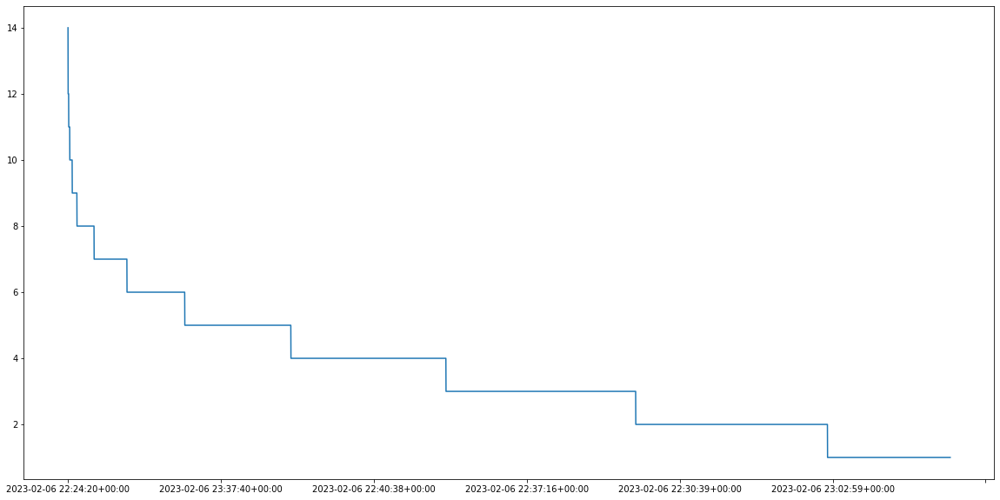

In [28]:
%matplotlib inline

df['Date'].value_counts().plot(figsize=(20,10))

In [29]:
[t for t in df.Tweet]

['İstanbulda gök gürültüsü başladı Allah’ım sen koru #İstanbul #deprem',
 '#deprem \nBu gece dualarımız enkaz altında kalanlar için. Allah yar ve yardımcıları olsun. https://t.co/8rFgvJcPsT',
 'Ülkede afet var fırsatçılar iş başında..!\nÜlkede yas var fırsatçılar iş başında…! \nÜlkede yaralılar var, hayatını kaybedenler var, enkaz altında kalan hayatlar var ama bizim ülkemizde fırsattan istifade eden şerefsiz haysiyetsiz ahlam yoksunu esnaf var..🤬🤬🤬🤬\n\n#deprem #ohal',
 'ARKADAŞIMIZDAN HABER ALAMIYORUZ ACİLEN RT ATIP YAYALIM \n\nMarmara Japonya Celal Şengör 13 Şubat #deprem #Kahramanmaras #hatay Fox TV Antakya Hatay Kırıkhan Ulaşamıyoruz 6 Hatay Gölcük Ordu Adıyaman  İğrençsiniz Fatma Şahin Neredeyse 24 Ordu B Blok 3 Asker Nolur Konya Dilara Akar https://t.co/Kncegarov6',
 'Askerlerimiz kışladan çıksın  Yollar KAPALI  zaman yok #tsk 🇹🇷 #deprem https://t.co/RcIqBMgJmh',
 'Gün suçlu arama; sağa veya sola çamur atma, iktidar veya muhalefet yerme vakti değil. Gün birlik vakti, önce hayatla

In [10]:
tweet_all_texts = " ".join(t for t in df.Tweet)
print("#deprem twitlerinin tamamı {0} adet kelimeden oluşuyor".format(len(tweet_all_texts)))

#deprem twitlerinin tamamı 3532349 adet kelimeden oluşuyor


In [11]:
tweet_positive_texts = " ".join(t for t in df_positive.Tweet)
print("#deprem pozitif twitlerinin tamamı {0} adet kelimeden oluşuyor".format(len(tweet_positive_texts)))

#deprem pozitif twitlerinin tamamı 1153484 adet kelimeden oluşuyor


In [12]:
tweet_negative_texts = " ".join(t for t in df_negative.Tweet)
print("#deprem negatif twitlerinin tamamı {0} adet kelimeden oluşuyor".format(len(tweet_negative_texts)))

#deprem negatif twitlerinin tamamı 2378864 adet kelimeden oluşuyor


In [33]:
tweet_all_texts

Output hidden; open in https://colab.research.google.com to view.

### Tokenizer

In [34]:
token_words = word_tokenize(tweet_all_texts)
print(token_words)
print(len(token_words))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Cleaner

In [35]:
tweet_all_texts_clean = preprocess_tweet(tweet_all_texts)
tweet_all_texts_clean

Output hidden; open in https://colab.research.google.com to view.

In [36]:
txt = "yıl olmuş 2013 konya torku şeker, 5861 konyaspor fenerbahçeyi gözüne kestirdi "
preprocess_tweet(txt)

'yıl olmuş konya torku şeker  konyaspor fenerbahçeyi gözüne kestirdi'

In [37]:
token_words_clean = word_tokenize(tweet_all_texts_clean)
print(token_words_clean)
print(len(token_words_clean))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Clean Stop Words

In [38]:
stop_words = set(get_stopwords_list())

token_words_clean_ = [w for w in token_words_clean if not w in stop_words and len(w)>1]
print(token_words_clean_)
print(len(token_words_clean_))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Words Frequency

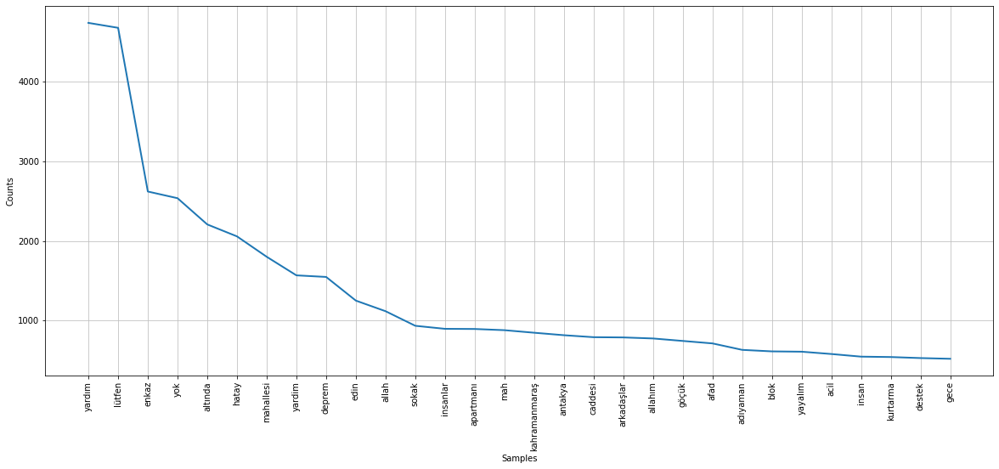

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [39]:
fdist_filtered = FreqDist(token_words_clean_)
#fdist_filtered.plot(30,title='Frequency distribution for 30 most common tokens in our text collection (excluding stopwords and punctuation)')
plt.figure(figsize=(20, 8))
fdist_filtered.plot(30)

In [40]:
from collections import Counter

d = Counter(fdist_filtered)
d.most_common(100)

[('yardım', 4737),
 ('lütfen', 4675),
 ('enkaz', 2621),
 ('yok', 2537),
 ('altında', 2208),
 ('hatay', 2058),
 ('mahallesi', 1802),
 ('yardim', 1569),
 ('deprem', 1549),
 ('edin', 1252),
 ('allah', 1119),
 ('sokak', 936),
 ('insanlar', 898),
 ('apartmanı', 896),
 ('mah', 881),
 ('kahramanmaraş', 849),
 ('antakya', 818),
 ('caddesi', 793),
 ('arkadaşlar', 790),
 ('allahım', 777),
 ('göçük', 746),
 ('afad', 715),
 ('adıyaman', 634),
 ('blok', 615),
 ('yayalım', 611),
 ('aci̇l', 582),
 ('insan', 549),
 ('kurtarma', 544),
 ('destek', 531),
 ('gece', 522),
 ('nolur', 504),
 ('apt', 481),
 ('büyük', 454),
 ('yayalim', 441),
 ('kişi', 435),
 ('varsa', 434),
 ('edi̇n', 434),
 ('sitesi', 429),
 ('merkez', 414),
 ('bekliyor', 414),
 ('ulaşamıyoruz', 401),
 ('durumda', 401),
 ('altinda', 395),
 ('alamıyoruz', 388),
 ('kat', 386),
 ('ailesi', 385),
 ('kalan', 383),
 ('hava', 376),
 ('bina', 375),
 ('i̇nsanlar', 373),
 ('soğuk', 369),
 ('yardıma', 367),
 ('kötü', 357),
 ('ekip', 345),
 ('devlet', 3

In [41]:
len(fdist_filtered)

43707

### Word Cloud

43707


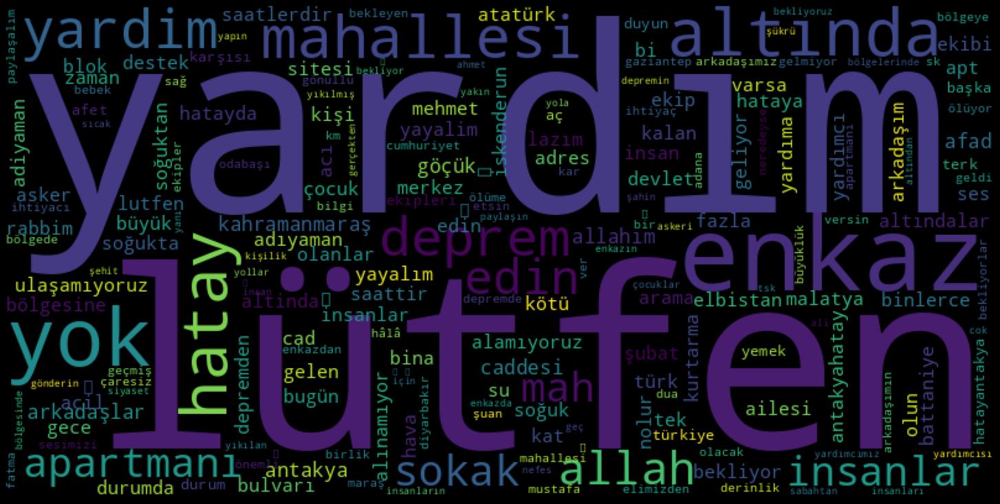

In [42]:
generate_word_cloud_from_frequencies(fdist_filtered, "all")

In [43]:
#generate_word_cloud(tweet_all_texts_clean, "all")

## POSITIVE
### Tokenizer

In [44]:
token_positive_words = word_tokenize(tweet_positive_texts)
print(token_positive_words)
print(len(token_positive_words))

['#', 'deprem', 'Bu', 'gece', 'dualarımız', 'enkaz', 'altında', 'kalanlar', 'için', '.', 'Allah', 'yar', 've', 'yardımcıları', 'olsun', '.', 'https', ':', '//t.co/8rFgvJcPsT', 'Askerlerimiz', 'kışladan', 'çıksın', 'Yollar', 'KAPALI', 'zaman', 'yok', '#', 'tsk', '🇹🇷', '#', 'deprem', 'https', ':', '//t.co/RcIqBMgJmh', 'Gün', 'suçlu', 'arama', ';', 'sağa', 'veya', 'sola', 'çamur', 'atma', ',', 'iktidar', 'veya', 'muhalefet', 'yerme', 'vakti', 'değil', '.', 'Gün', 'birlik', 'vakti', ',', 'önce', 'hayatlarımızı', 'kurtaralım', ',', 'yaralarımızı', 'saralım', ',', 'açta', 'açıkta', 'kalanlara', 'kol', 'kanat', 'gerelim', '.', 'Sonra', 'ister', 'muhalefet', 'isterseniz', 'yargıç', 'olursunuz', '.', '#', 'deprem', 'Keşke', ',', 'Keşkee', ',', 'Keşkeee', '🙏🙄', '#', 'deprem', '#', 'TSKsahaya', 'https', ':', '//t.co/JPMccf06tl', 'SİTE', '1', 'NO:20', 'HATAY', 'MERKEZ', 'MELİSA', 'YARDIM', 'BEKLİYOR', '#', 'afaddeprem', '#', 'yardım', '#', 'deprem', '#', 'afad', 'YAYALIM', '#', 'deprem', '@', 'AFA

### Cleaner

In [45]:
tweet_positive_texts_clean = preprocess_tweet(tweet_positive_texts)
tweet_positive_texts_clean

'bu gece dualarımız enkaz altında kalanlar için  allah yar ve yardımcıları olsun  askerlerimiz kışladan çıksın yollar kapali zaman yok gün suçlu arama  sağa veya sola çamur atma  iktidar veya muhalefet yerme vakti değil  gün birlik vakti  önce hayatlarımızı kurtaralım  yaralarımızı saralım  açta açıkta kalanlara kol kanat gerelim  sonra ister muhalefet isterseniz yargıç olursunuz  keşke  keşkee  keşkee si̇te no:20 hatay merkez meli̇sa yardim bekli̇yor yayalim lutfen goren herkes lesin haber alamadık  sabri saraç  gökçe saraç  hayat antakya esentepe mah  mahmut alpagot bulvari göçmen apart  antakya hatay tarim kredi koop karsisi ahh hatayın yalnızlığı bu günah kimin boynuna  galeriada yetkililer biraz uğraşıp bölgeyi terketmişler hala bulunamayan 10larca insan var o sitede aci̇l eki̇p lazim galeria sitesine artçılar devam ediyor lütfen önlem ve tedbirlerimizi alalım  binalar agirş yapmayalım  yüksek binaların yanımda yöresinde durmayalım  patlayıcı olan yerleşen uzak duralım  afad ekıpl

In [46]:
token_positive_words_clean = word_tokenize(tweet_positive_texts_clean)
print(token_positive_words_clean)
print(len(token_positive_words_clean))

['bu', 'gece', 'dualarımız', 'enkaz', 'altında', 'kalanlar', 'için', 'allah', 'yar', 've', 'yardımcıları', 'olsun', 'askerlerimiz', 'kışladan', 'çıksın', 'yollar', 'kapali', 'zaman', 'yok', 'gün', 'suçlu', 'arama', 'sağa', 'veya', 'sola', 'çamur', 'atma', 'iktidar', 'veya', 'muhalefet', 'yerme', 'vakti', 'değil', 'gün', 'birlik', 'vakti', 'önce', 'hayatlarımızı', 'kurtaralım', 'yaralarımızı', 'saralım', 'açta', 'açıkta', 'kalanlara', 'kol', 'kanat', 'gerelim', 'sonra', 'ister', 'muhalefet', 'isterseniz', 'yargıç', 'olursunuz', 'keşke', 'keşkee', 'keşkee', 'si̇te', 'no:20', 'hatay', 'merkez', 'meli̇sa', 'yardim', 'bekli̇yor', 'yayalim', 'lutfen', 'goren', 'herkes', 'lesin', 'haber', 'alamadık', 'sabri', 'saraç', 'gökçe', 'saraç', 'hayat', 'antakya', 'esentepe', 'mah', 'mahmut', 'alpagot', 'bulvari', 'göçmen', 'apart', 'antakya', 'hatay', 'tarim', 'kredi', 'koop', 'karsisi', 'ahh', 'hatayın', 'yalnızlığı', 'bu', 'günah', 'kimin', 'boynuna', 'galeriada', 'yetkililer', 'biraz', 'uğraşıp', 

### Clean Stop Words

In [47]:
token_positive_words_clean_ = [w for w in token_positive_words_clean if not w in stop_words and len(w)>1]
print(token_positive_words_clean_)
print(len(token_positive_words_clean_))

['gece', 'dualarımız', 'enkaz', 'altında', 'kalanlar', 'allah', 'yar', 'yardımcıları', 'askerlerimiz', 'kışladan', 'çıksın', 'yollar', 'kapali', 'zaman', 'yok', 'suçlu', 'arama', 'sağa', 'sola', 'çamur', 'atma', 'iktidar', 'muhalefet', 'yerme', 'vakti', 'birlik', 'vakti', 'hayatlarımızı', 'kurtaralım', 'yaralarımızı', 'saralım', 'açta', 'açıkta', 'kalanlara', 'kol', 'kanat', 'gerelim', 'muhalefet', 'isterseniz', 'yargıç', 'olursunuz', 'keşke', 'keşkee', 'keşkee', 'si̇te', 'no:20', 'hatay', 'merkez', 'meli̇sa', 'yardim', 'bekli̇yor', 'yayalim', 'lutfen', 'goren', 'lesin', 'alamadık', 'sabri', 'saraç', 'gökçe', 'saraç', 'hayat', 'antakya', 'esentepe', 'mah', 'mahmut', 'alpagot', 'bulvari', 'göçmen', 'apart', 'antakya', 'hatay', 'tarim', 'kredi', 'koop', 'karsisi', 'ahh', 'hatayın', 'yalnızlığı', 'günah', 'boynuna', 'galeriada', 'yetkililer', 'uğraşıp', 'bölgeyi', 'terketmişler', 'bulunamayan', '10larca', 'insan', 'sitede', 'aci̇l', 'eki̇p', 'lazim', 'galeria', 'sitesine', 'artçılar', 'lü

### Words Frequency

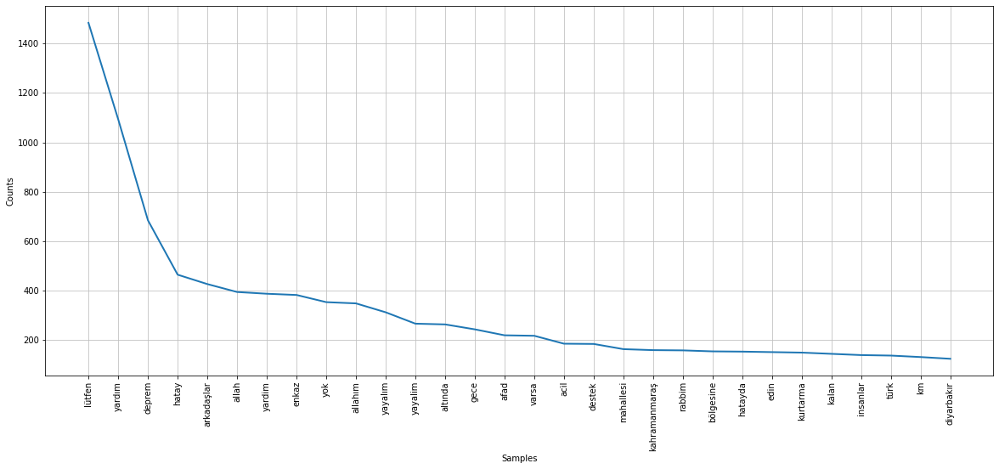

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [48]:
fdist_filtered_positive = FreqDist(token_positive_words_clean_)
plt.figure(figsize=(20, 8))
#fdist_filtered_positive.plot(30,title='POSITIVE - Frequency distribution for 30 most common tokens in our text collection (excluding stopwords and punctuation)')
fdist_filtered_positive.plot(30)

In [49]:
d = Counter(fdist_filtered_positive)
d.most_common(100)

[('lütfen', 1483),
 ('yardım', 1093),
 ('deprem', 685),
 ('hatay', 465),
 ('arkadaşlar', 427),
 ('allah', 395),
 ('yardim', 388),
 ('enkaz', 383),
 ('yok', 354),
 ('allahım', 349),
 ('yayalım', 313),
 ('yayalim', 267),
 ('altında', 264),
 ('gece', 244),
 ('afad', 220),
 ('varsa', 218),
 ('aci̇l', 186),
 ('destek', 185),
 ('mahallesi', 164),
 ('kahramanmaraş', 160),
 ('rabbim', 159),
 ('bölgesine', 155),
 ('hatayda', 154),
 ('edin', 152),
 ('kurtarma', 150),
 ('kalan', 145),
 ('insanlar', 140),
 ('türk', 138),
 ('km', 132),
 ('diyarbakır', 125),
 ('önemli̇', 123),
 ('adıyaman', 122),
 ('tek', 122),
 ('sokak', 121),
 ('lutfen', 120),
 ('büyük', 119),
 ('türkiye', 119),
 ('nolur', 117),
 ('geçmiş', 116),
 ('bekliyor', 115),
 ('bugün', 113),
 ('hataya', 111),
 ('birlik', 110),
 ('adana', 108),
 ('sağ', 108),
 ('hava', 108),
 ('yardıma', 107),
 ('zaman', 106),
 ('insan', 106),
 ('gelen', 106),
 ('derinlik', 104),
 ('arama', 103),
 ('antakya', 101),
 ('gönüllü', 100),
 ('büyüklük', 100),
 ('

### Word Cloud

43707


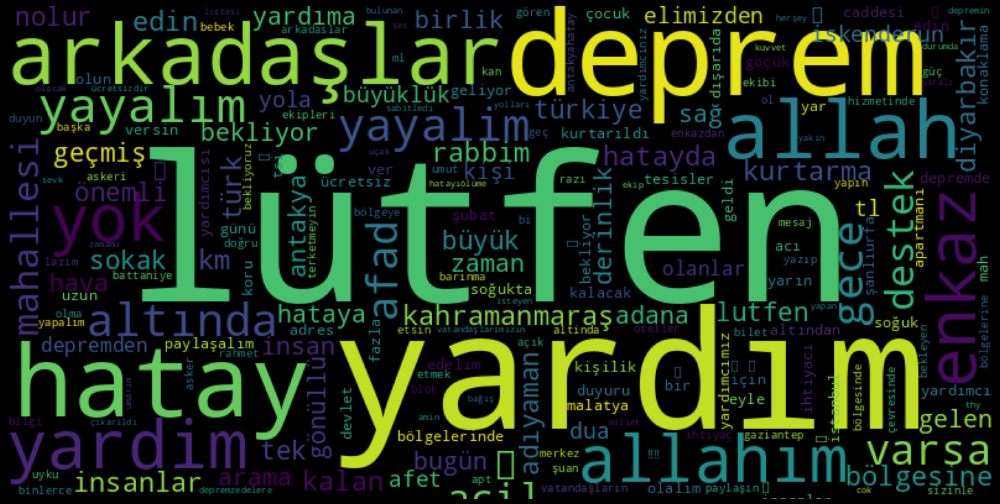

In [50]:
generate_word_cloud_from_frequencies(fdist_filtered_positive, "positive")

In [51]:
#generate_word_cloud(tweet_positive_texts_clean, "positive")

## NEGATIVE
### Tokenizer

In [52]:
token_negative_words = word_tokenize(tweet_negative_texts)
print(token_negative_words)
print(len(token_negative_words))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Cleaner

In [53]:
tweet_negative_texts_clean = preprocess_tweet(tweet_negative_texts)
tweet_negative_texts_clean

'i̇stanbulda gök gürültüsü başladı allahım sen koru ülkede afet var fırsatçılar iş başında  ülkede yas var fırsatçılar iş başında  ülkede yaralılar var  hayatını kaybedenler var  enkaz altında kalan hayatlar var ama bizim ülkemizde fırsattan istifade eden şerefsiz haysiyetsiz ahlam yoksunu esnaf var arkadaşimizdan haber alamiyoruz aci̇len atip yayalim marmara japonya celal şengör şubat fox tv antakya hatay kırıkhan ulaşamıyoruz hatay gölcük ordu adıyaman i̇ğrençsiniz fatma şahin neredeyse ordu b blok asker nolur konya dilara akar adıyaman yardım bekliyor nolur enkaz altınlarda binlerce kişi var nolur yardım edin dua edin nolur hava çok soğuk sığınacak yer yok yardım edin lütfenn çorludan toplanıp hataya yardıma gitmek için ulaşım yolu bakıyoruz ancak hiçbir firma hiçbir şekilde gidişe indirim yapmıyor bu kadar kötü bir durumda yardım etmek için maddi durumda yardımcı bile olmuyorlar göçük altında kalan arkadaşlar buraya yazın gün birlik gün afada ulaşamıyoruz site çökmüş  gönüllü olmak

In [54]:
token_negative_words_clean = word_tokenize(tweet_negative_texts_clean)
print(token_negative_words_clean)
print(len(token_negative_words_clean))

Output hidden; open in https://colab.research.google.com to view.

### Clean Stop Words

In [55]:
token_negative_words_clean_ = [w for w in token_negative_words_clean if not w in stop_words and len(w)>1]
print(token_negative_words_clean_)
print(len(token_negative_words_clean_))

['i̇stanbulda', 'gök', 'gürültüsü', 'başladı', 'allahım', 'koru', 'ülkede', 'afet', 'fırsatçılar', 'başında', 'ülkede', 'yas', 'fırsatçılar', 'başında', 'ülkede', 'yaralılar', 'hayatını', 'kaybedenler', 'enkaz', 'altında', 'kalan', 'hayatlar', 'ülkemizde', 'fırsattan', 'istifade', 'şerefsiz', 'haysiyetsiz', 'ahlam', 'yoksunu', 'esnaf', 'arkadaşimizdan', 'alamiyoruz', 'aci̇len', 'atip', 'yayalim', 'marmara', 'japonya', 'celal', 'şengör', 'şubat', 'fox', 'tv', 'antakya', 'hatay', 'kırıkhan', 'ulaşamıyoruz', 'hatay', 'gölcük', 'ordu', 'adıyaman', 'i̇ğrençsiniz', 'fatma', 'şahin', 'neredeyse', 'ordu', 'blok', 'asker', 'nolur', 'konya', 'dilara', 'akar', 'adıyaman', 'yardım', 'bekliyor', 'nolur', 'enkaz', 'altınlarda', 'binlerce', 'kişi', 'nolur', 'yardım', 'edin', 'dua', 'edin', 'nolur', 'hava', 'soğuk', 'sığınacak', 'yok', 'yardım', 'edin', 'lütfenn', 'çorludan', 'toplanıp', 'hataya', 'yardıma', 'gitmek', 'ulaşım', 'yolu', 'bakıyoruz', 'gidişe', 'indirim', 'yapmıyor', 'kötü', 'durumda', '

### Words Frequency

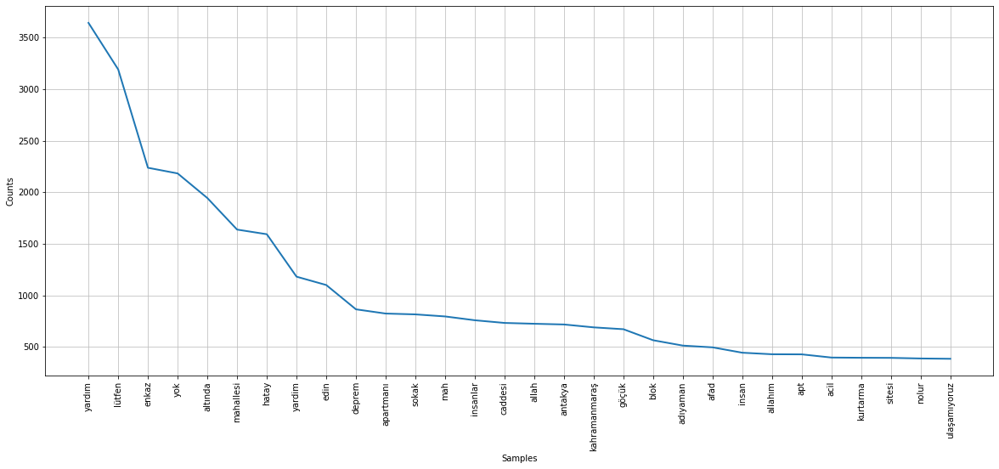

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [56]:
fdist_filtered_negative = FreqDist(token_negative_words_clean_)
plt.figure(figsize=(20, 8))
#fdist_filtered_negative.plot(30,title='NEGATIVE - Frequency distribution for 30 most common tokens in our text collection (excluding stopwords and punctuation)')
fdist_filtered_negative.plot(30)

In [57]:
d = Counter(fdist_filtered_negative)
d.most_common(100)

[('yardım', 3644),
 ('lütfen', 3192),
 ('enkaz', 2238),
 ('yok', 2183),
 ('altında', 1944),
 ('mahallesi', 1638),
 ('hatay', 1593),
 ('yardim', 1181),
 ('edin', 1100),
 ('deprem', 864),
 ('apartmanı', 823),
 ('sokak', 815),
 ('mah', 795),
 ('insanlar', 758),
 ('caddesi', 732),
 ('allah', 724),
 ('antakya', 717),
 ('kahramanmaraş', 689),
 ('göçük', 671),
 ('blok', 564),
 ('adıyaman', 512),
 ('afad', 495),
 ('insan', 443),
 ('allahım', 428),
 ('apt', 427),
 ('aci̇l', 396),
 ('kurtarma', 394),
 ('sitesi', 393),
 ('nolur', 387),
 ('ulaşamıyoruz', 384),
 ('alamıyoruz', 372),
 ('edi̇n', 368),
 ('kat', 364),
 ('arkadaşlar', 363),
 ('merkez', 361),
 ('durumda', 358),
 ('ailesi', 351),
 ('destek', 346),
 ('altinda', 343),
 ('kişi', 340),
 ('bina', 336),
 ('büyük', 335),
 ('kötü', 328),
 ('i̇nsanlar', 312),
 ('cad', 311),
 ('altındalar', 308),
 ('ekip', 301),
 ('bekliyor', 299),
 ('yayalım', 298),
 ('soğuk', 294),
 ('mehmet', 288),
 ('bulvarı', 284),
 ('gece', 278),
 ('atatürk', 277),
 ('saattir

### Word Cloud

43707


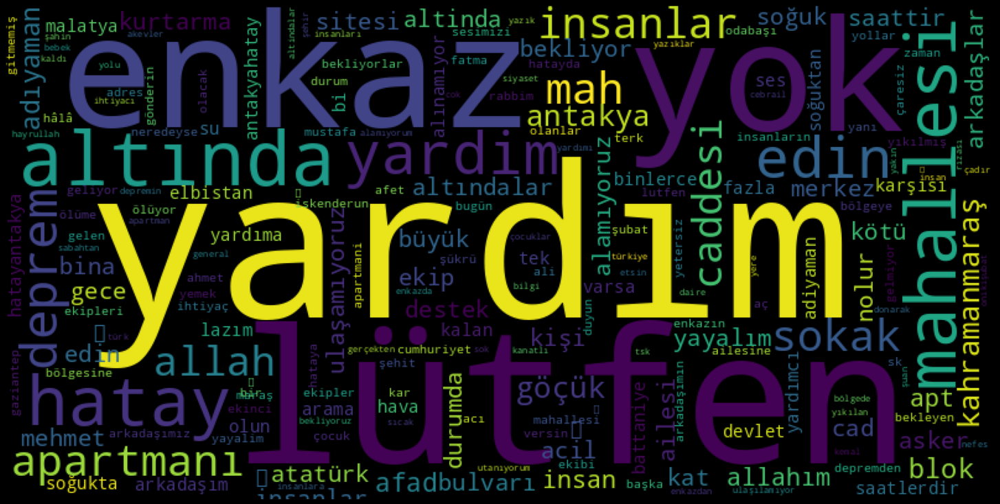

In [58]:
generate_word_cloud_from_frequencies(fdist_filtered_negative, "negative")

In [59]:
#generate_word_cloud(tweet_negative_texts_clean, "negative")

## DIFF

In [60]:
diff_only_positive = set(token_positive_words) - set(token_negative_words)
diff_only_positive

{'//t.co/9JMxVCpeSU',
 'PAYLAŞIYORUZ',
 '3.Kat🔴🔴🔴',
 'Allahından',
 'Sağcı',
 'atıyorsun',
 'yaralananları',
 'CEVRESİNDE',
 'BAŞIN',
 'iyilikler',
 'İRTİBAT:05350515295',
 '🤍🖤',
 '//t.co/Q22eLgO10L',
 'sahadan',
 '//t.co/GkqOLDH57v',
 '//t.co/4wtz7V2BJy',
 'tweetlerine',
 'ISTIYORUZ',
 '//t.co/XoM6SMh2OK',
 'SEZERDEN',
 'birsek',
 'Bağışlayanların',
 'yanıtlıyor',
 '116',
 'Taşıyacak',
 'iletilmiş',
 '//t.co/wQSZ8zdtCL',
 'ALANI',
 '//t.co/bygPRmFMcZ',
 'kaybetmek',
 'cavab',
 'düşünülemez',
 '//t.co/IdTUzI1YmB',
 '//t.co/dEuoL1YDsi',
 'Adana😢',
 '//t.co/rquTymJjM8',
 '//t.co/ekrpLrfsJs',
 '//t.co/pUhzvLeoFe',
 '🙏🏻❤️',
 '//t.co/drwDDc857Q',
 'Vanda',
 '//t.co/RP9OyNgO2f',
 'üzücü…',
 'umutsuzluğun',
 'ALTINDAYKEN',
 '//t.co/Tv9ZI78TOr',
 '//t.co/DDRSZwLia2',
 'Belirledi',
 '//t.co/AFxc5ojPvK',
 '//t.co/wT1FDyfjO7',
 'sabitledi.Mobil',
 'dışıma',
 'kötülüyor',
 'isterdim🤔',
 'mileti',
 '//t.co/3an7fYYXn8',
 'HatayKırıkhane',
 'diyelım',
 'savunuyordunuz',
 'taban',
 'ilkeleri',
 'kulak

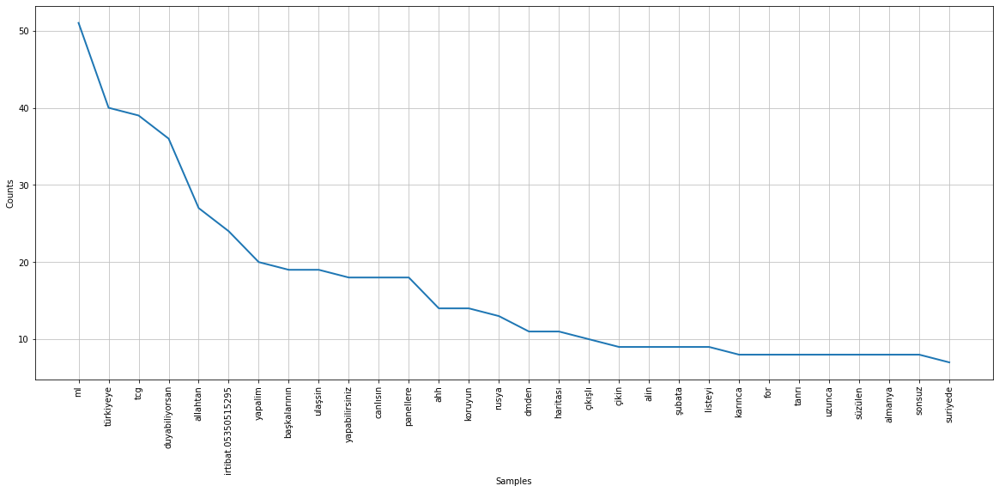

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [61]:
only_positive = []
for positive_word in token_positive_words_clean_:
  if positive_word in diff_only_positive:
    only_positive.append(positive_word)


fdist_filtered_only_positive = FreqDist(only_positive)
plt.figure(figsize=(20, 8))
fdist_filtered_only_positive.plot(30)

In [62]:
d = Counter(only_positive)
d.most_common(100)

[('ml', 51),
 ('türkiyeye', 40),
 ('tcg', 39),
 ('duyabiliyorsan', 36),
 ('allahtan', 27),
 ('irtibat.05350515295', 24),
 ('yapalim', 20),
 ('başkalarının', 19),
 ('ulaşsin', 19),
 ('yapabilirsiniz', 18),
 ('canlısın', 18),
 ('panellere', 18),
 ('ahh', 14),
 ('koruyun', 14),
 ('rusya', 13),
 ('dmden', 11),
 ('haritası', 11),
 ('çıkışlı', 10),
 ('çikin', 9),
 ('alin', 9),
 ('şubata', 9),
 ('listeyi', 9),
 ('karınca', 8),
 ('for', 8),
 ('tanrı', 8),
 ('uzunca', 8),
 ('süzülen', 8),
 ('almanya', 8),
 ('sonsuz', 8),
 ('suriyede', 7),
 ('anlatıyor', 7),
 ('yanınızdayız', 7),
 ('sever', 7),
 ('abd', 7),
 ('yaşatır', 7),
 ('yolunuz', 7),
 ('olabilirim', 7),
 ('azerbaycan', 7),
 ('rabbimiz', 7),
 ('timi', 7),
 ('seviye', 7),
 ('kahramanmaraşın', 6),
 ('online', 6),
 ('duyurulur', 6),
 ('ölse', 6),
 ('oralı', 6),
 ('seninle', 6),
 ('görüntülendi', 6),
 ('sarmak', 6),
 ('kuvvetlerine', 6),
 ('numaralardan', 6),
 ('bursa', 6),
 ('söylenecek', 6),
 ('fav', 6),
 ('uçağıyla', 6),
 ('yaralanan', 6),


43707


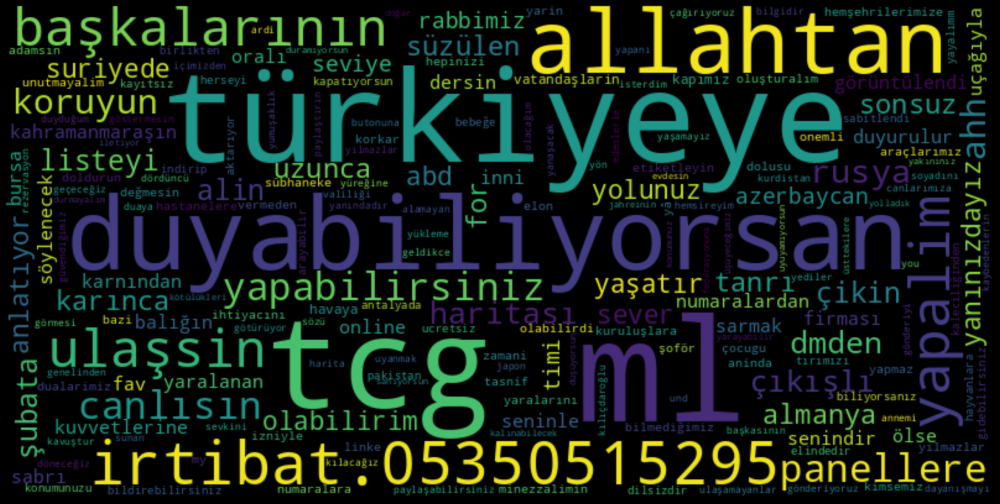

In [63]:
generate_word_cloud_from_frequencies(fdist_filtered_only_positive, "only_positive")

In [64]:
diff_only_negative = set(token_negative_words) - set(token_positive_words)
diff_only_negative

{'iklim',
 'erislis',
 'Gürler',
 'Israil',
 'Gaziantep/ıslahiye',
 'AİLECEK',
 'azinda',
 'Çekmen',
 'bozar',
 'açamıyorum',
 'TREND',
 'Askeriyenin',
 'işçilik',
 'Askere',
 'Doktoru',
 'Şıldak',
 'Mezbahane',
 'setlerinin',
 'artıkkk',
 '//t.co/yZarGqgW66',
 'girmiş',
 'Kincir',
 'minareler',
 'selâ',
 'mahmut',
 'HALİNDE',
 'aklına',
 'bebekli',
 'vinçlere',
 'fehmi',
 'ısıtıcıları',
 'bka',
 'acilar',
 'bağışlardan',
 'birbirinizi',
 'No:13',
 'uyuyamayacağım',
 'FETO',
 'KAHRAMANMARAŞ/PAZARCIK',
 'Yıkamanın',
 'alçaklar',
 'sarsıntıların',
 'koray',
 'yazsak',
 'Kapı:65',
 'dudağı',
 'Saygıları',
 'çıkmışlardı',
 'irili',
 'düşündük',
 'Hicbir',
 'Zara',
 'ÜYELERİNDEN',
 'almamışsınız',
 'cevrail',
 'çağırıyorum',
 "Deprem'in",
 'edilmis.Ücra',
 '1.blok',
 'selcukozdag',
 'AB',
 'bildirimi',
 'et🙏',
 'göçenler',
 'şerefsizler…',
 'ALINAMAMIŞ',
 'getirmesin',
 'HMBakanligi',
 'başın',
 'öldürüleceğine',
 'duymuyor.lutfen',
 'RANA',
 'yengeme',
 'Yetriz',
 'GAŹIANTEP',
 'ondalık',


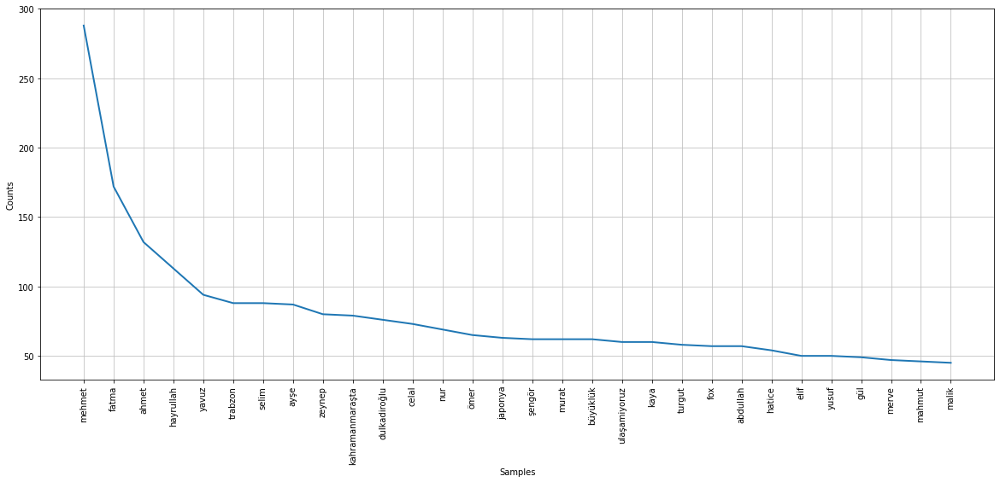

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [65]:
only_negative = []
for negative_word in token_negative_words_clean_:
  if negative_word in diff_only_negative:
    only_negative.append(negative_word)


fdist_filtered_only_negative = FreqDist(only_negative)
plt.figure(figsize=(20, 8))
fdist_filtered_only_negative.plot(30)

In [66]:
d = Counter(only_negative)
d.most_common(30)

[('mehmet', 288),
 ('fatma', 172),
 ('ahmet', 132),
 ('hayrullah', 113),
 ('yavuz', 94),
 ('trabzon', 88),
 ('selim', 88),
 ('ayşe', 87),
 ('zeynep', 80),
 ('kahramanmaraşta', 79),
 ('dulkadiroğlu', 76),
 ('celal', 73),
 ('nur', 69),
 ('ömer', 65),
 ('japonya', 63),
 ('şengör', 62),
 ('murat', 62),
 ('büyüklük', 62),
 ('ulaşamiyoruz', 60),
 ('kaya', 60),
 ('turgut', 58),
 ('fox', 57),
 ('abdullah', 57),
 ('hatice', 54),
 ('elif', 50),
 ('yusuf', 50),
 ('gül', 49),
 ('merve', 47),
 ('mahmut', 46),
 ('malik', 45)]

43707


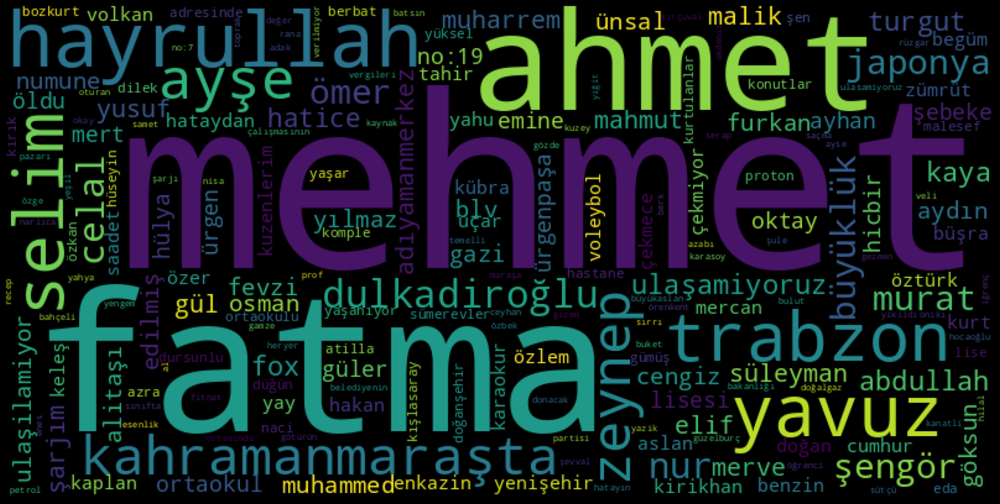

In [67]:
generate_word_cloud_from_frequencies(fdist_filtered_only_negative, "only_negative")

## CONTAINS

In [77]:
df_filter = df[df["Tweet"].str.contains("fox")]
df_filter

,Unnamed: 0,ID,Date,Username,Tweet,ReplyCount,RetweetCount,LikeCount,QuoteCount,URL
10,10,1622746945784512514,2023-02-06 23:59:55+00:00,Denzi28,#hatayyardimbekliyor #deprem #foxtv @ahbap @De...,1,2,4,0,https://twitter.com/Denzi28/status/16227469457...
12,12,1622746942907248641,2023-02-06 23:59:55+00:00,fkrcbn,Haber alamadık. Sabri Saraç: 05058032502\nGökç...,0,6,3,0,https://twitter.com/fkrcbn/status/162274694290...
36,36,1622746896979619840,2023-02-06 23:59:44+00:00,ozgursekmenn,YAYALIM!!! 🙏\n#Akut #deprem #diyarbakir #hatay...,0,11,5,0,https://twitter.com/ozgursekmenn/status/162274...
57,57,1622746861168648194,2023-02-06 23:59:35+00:00,TahaB8,Asker çıksın biz gidelim bir şey yapalım İNSAN...,0,0,0,0,https://twitter.com/TahaB8/status/162274686116...
177,177,1622746629844467712,2023-02-06 23:58:40+00:00,Ahmetusmann,FIRAT’IN YARDIMA İHTİYACI VAR ACİLEN RT ATIP Y...,0,9,2,0,https://twitter.com/Ahmetusmann/status/1622746...
217,217,1622746550702157831,2023-02-06 23:58:21+00:00,Deryaceetin_,Her konuda yetersiz bir ülkeyiz hiç bir zaman ...,0,0,0,0,https://twitter.com/Deryaceetin_/status/162274...
227,227,1622746532431659009,2023-02-06 23:58:17+00:00,yyattess,arkadaşlar uzaktan yardım etmek isteyenler yar...,0,0,0,0,https://twitter.com/yyattess/status/1622746532...
257,257,1622746465482178564,2023-02-06 23:58:01+00:00,MekinSezen,Bakın. Adilik yapıyorsunuz. Kansızlık yapmayın...,0,1,2,0,https://twitter.com/MekinSezen/status/16227464...
279,279,1622746420250923010,2023-02-06 23:57:50+00:00,berkegnr1,CUMHURİYET MAHALLESİ 378. SOKAK HATAY / KIRIKH...,0,5,1,0,https://twitter.com/berkegnr1/status/162274642...
321,321,1622746342438105090,2023-02-06 23:57:31+00:00,aleywkk,Doğum yapmak üzere olan bi kadın var enkaz alt...,3,57,41,3,https://twitter.com/aleywkk/status/16227463424...


In [78]:
df_filter[df_filter.index==10].Tweet.item()

'#hatayyardimbekliyor #deprem #foxtv @ahbap @DepremDairesi \nçorludan toplanıp hataya yardıma gitmek için ulaşım yolu bakıyoruz ancak hiçbir firma hiçbir şekilde gidişe indirim yapmıyor bu kadar kötü bir durumda yardım etmek için maddi durumda yardımcı bile olmuyorlar'

## INTERSECTION

In [72]:
negative_and_positive = set(token_negative_words) - set(diff_only_negative)
negative_and_positive

{'Yardımda',
 'Turkey',
 'HERKEZ',
 'ailesinden',
 'GELİYOR',
 'kasabalar',
 'DR.',
 'mümkünse',
 'Belki',
 'öldürmedi',
 '=',
 'Boylam:37.401',
 'soran',
 'götürmek',
 'levent',
 'korunmak',
 'ınsanlar',
 'BİLİM',
 'gidemiyorsunuz',
 'süre',
 'Şu',
 'açmaya',
 'aracımız',
 "Muş'ta",
 'iki',
 '01.50',
 'Yeniden',
 'İLETİŞİM',
 'ÇOCUĞU',
 'görünmüyor',
 'dağıtan',
 '0537',
 'belediyesinde',
 'hıçkıra',
 'Cad',
 'gelebilecek',
 'enkazdakileri',
 'İSİM',
 'kokusuz',
 'uzaktan',
 'bloklu',
 'aracılığı',
 'durumdaki',
 'KAN',
 'kurulmuş',
 'yalvarırız',
 'tevekkül',
 'HATAYI',
 'raylı',
 '17',
 'Burda',
 'zaruri',
 'imamları',
 'insanlarda',
 'insanlarin',
 'enkazlarına',
 'başvuru',
 'uçuşlarda',
 'Trafiği',
 'yaşayıp',
 'ADIYAMANAcilYardım',
 'paylaşırmısınız',
 'katı',
 'HATAY-',
 'SAHİP',
 'HatayValiliği',
 'yapılmasına',
 'AFADKMaras',
 'temmuz',
 'Ya',
 'doktor',
 'vb',
 'uçuşunu',
 'Boş',
 'kampanyasına',
 'elbistanyardim',
 'olmayanlar',
 'saat',
 'dile',
 'KIZ',
 'çevir',
 'kadının

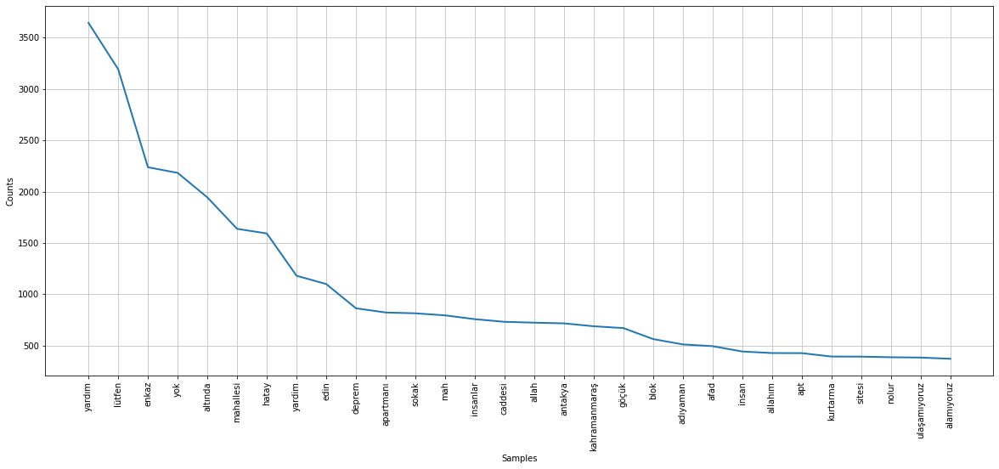

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [73]:
negative_and_positive_array = []
for negative_word in token_negative_words_clean_:
  if negative_word in negative_and_positive:
    negative_and_positive_array.append(negative_word)


fdist_filtered_negative_and_positive = FreqDist(negative_and_positive_array)
plt.figure(figsize=(20, 8))
fdist_filtered_negative_and_positive.plot(30)

In [74]:
d = Counter(negative_and_positive_array)
d.most_common(100)

[('yardım', 3644),
 ('lütfen', 3192),
 ('enkaz', 2238),
 ('yok', 2183),
 ('altında', 1944),
 ('mahallesi', 1638),
 ('hatay', 1593),
 ('yardim', 1181),
 ('edin', 1100),
 ('deprem', 864),
 ('apartmanı', 823),
 ('sokak', 815),
 ('mah', 795),
 ('insanlar', 758),
 ('caddesi', 732),
 ('allah', 724),
 ('antakya', 717),
 ('kahramanmaraş', 689),
 ('göçük', 671),
 ('blok', 564),
 ('adıyaman', 512),
 ('afad', 495),
 ('insan', 443),
 ('allahım', 428),
 ('apt', 427),
 ('kurtarma', 394),
 ('sitesi', 393),
 ('nolur', 387),
 ('ulaşamıyoruz', 384),
 ('alamıyoruz', 372),
 ('kat', 364),
 ('arkadaşlar', 363),
 ('merkez', 361),
 ('durumda', 358),
 ('ailesi', 351),
 ('destek', 346),
 ('altinda', 343),
 ('kişi', 340),
 ('bina', 336),
 ('büyük', 335),
 ('kötü', 328),
 ('cad', 311),
 ('altındalar', 308),
 ('ekip', 301),
 ('bekliyor', 299),
 ('yayalım', 298),
 ('soğuk', 294),
 ('bulvarı', 284),
 ('gece', 278),
 ('atatürk', 277),
 ('saattir', 275),
 ('asker', 274),
 ('arkadaşım', 274),
 ('hava', 268),
 ('su', 26